# Python Plotly Express Tutorial

## Introduction to Plotly

What is it, why should the reader care about Plotly and its advantages. (100 words)

![](images/histogram.gif)

## Basics of Plotly Express

Like any other tutorial, we start by installing the library through `pip` (or `conda` for some reason).

```bash
$ pip install --upgrade plotly
$ conda install -c conda-forge plotly
```

Folks at Plotly work like bees and release regular updates, so make sure the `--upgrade` tag is included if you already have the library installed. 

The tutorial focuses on the Express API of Ploty, which was introduced in 2019 (it is like it was yesterday), offering numerous benefits over the old ways of interacting with the core Plotly library:

- Stupidly simple syntax (reads almost like English)
- Wide range of visualizations (or tools to make up your own)
- Automatic axis and color scaling (a feature long overdue)
- Integration with pandas (you can use the Plotly plotting backend for Pandas `.plot` functions)

Here is an anatomy of a basic plot in Plotly Express:

```python
import plotly.express as px

fig = px.plotting_function(
    dataframe,
    x='column-for-xaxis',
    y='column-for-yaxis',
    title='Title For the Plot',
    xaxis_title="x-axis title",
    yaxis_title="y-axis title",
    width=width_in_pixels,
    height=height_in_pixels
)

fig.show()
```

Different plots reside under their own name like `histogram` or `scatter` under the `express` module, loaded as `px`. The first argument to any plotting function is the dataframe and the column names to be plotted for the X and Y axes. 

Good manners dictate that you give your plots informative `title` (so readers knows what it is about) and `xaxis_title` and `yaxis_title` parameters to know which features of the dataset are being used. 

A plotting function returns a `Figure` object, on top of which, you call the `show` method to display the plot in your dear notebook.

To start whippin' up plots, we need a dataset, so go ahead and grab one from Kaggle, preferably this [Diamonds dataset](https://www.kaggle.com/datasets/shivam2503/diamonds). It contains a nice combination of numeric and categorical features - perfect for the purposes of this article. 

In [82]:
import pandas as pd

diamonds = pd.read_csv("data/diamonds.csv")

diamonds.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


The dataset contains over 53k observations with 10 features. You can explore the basic stats of the data below.

In [83]:
diamonds.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 10 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   carat    53940 non-null  float64
 1   cut      53940 non-null  object 
 2   color    53940 non-null  object 
 3   clarity  53940 non-null  object 
 4   depth    53940 non-null  float64
 5   table    53940 non-null  float64
 6   price    53940 non-null  int64  
 7   x        53940 non-null  float64
 8   y        53940 non-null  float64
 9   z        53940 non-null  float64
dtypes: float64(6), int64(1), object(3)
memory usage: 4.1+ MB


In [84]:
diamonds.describe()

,carat,depth,table,price,x,y,z
count,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000
mean,0.797940,61.749405,57.457184,3932.799722,5.731157,5.734526,3.538734
std,0.474011,1.432621,2.234491,3989.439738,1.121761,1.142135,0.705699
min,0.200000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,0.400000,61.000000,56.000000,950.000000,4.710000,4.720000,2.910000
50%,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,1.040000,62.500000,59.000000,5324.250000,6.540000,6.540000,4.040000
max,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


## Analyzing distributions in Express

teach how to plot statistical properties of distributions (360 words)


### Histograms in Plotly Express

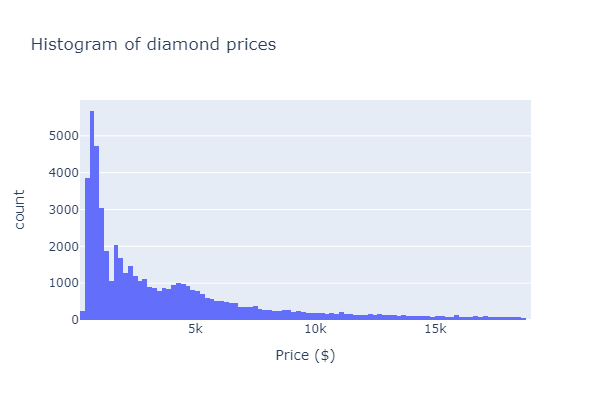

In [85]:
fig = px.histogram(
    diamonds,
    x="price",
    title="Histogram of diamond prices",
    labels={"price": "Price ($)"},
    width=600,
    height=400,
)

fig.show()

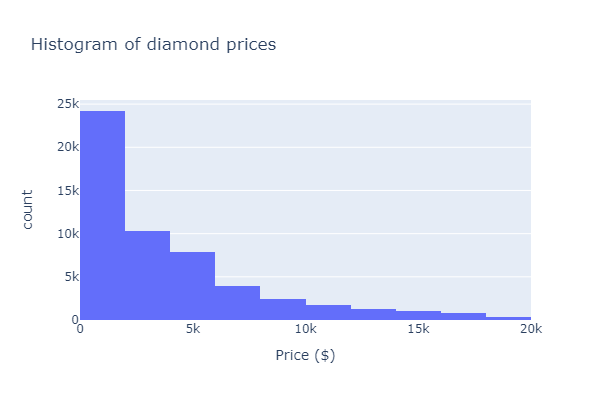

In [86]:
fig = px.histogram(
    diamonds,
    x="price",
    title="Histogram of diamond prices",
    labels={"price": "Price ($)"},
    nbins=10,
    width=600,
    height=400,
)

fig.show()

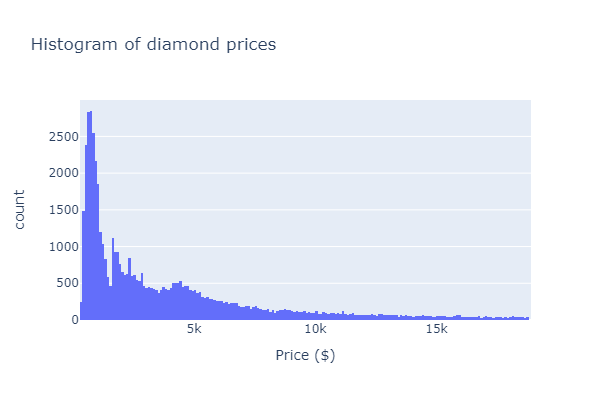

In [87]:
nbins = int(len(diamonds) ** (1 / 2))

fig = px.histogram(
    diamonds,
    x="price",
    title="Histogram of diamond prices",
    labels={"price": "Price ($)"},
    nbins=nbins,
    width=600,
    height=400,
)

fig.show()

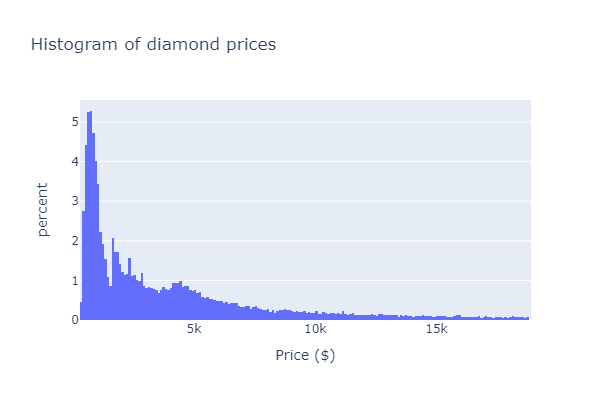

In [88]:
nbins = int(len(diamonds) ** (1 / 2))

fig = px.histogram(
    diamonds,
    x="price",
    title="Histogram of diamond prices",
    labels={"price": "Price ($)"},
    nbins=nbins,
    width=600,
    height=400,
    histnorm="percent",
)

fig.show()

### Bar charts

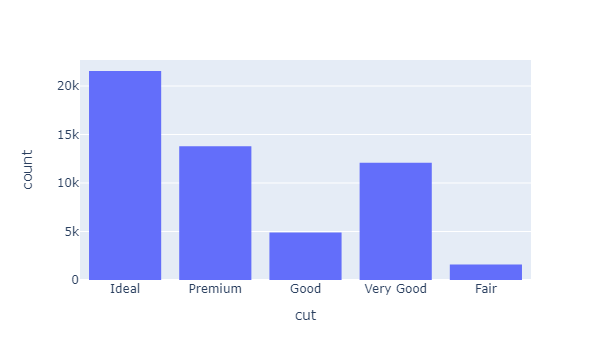

In [89]:
fig = px.histogram(diamonds, x="cut")

fig.show()

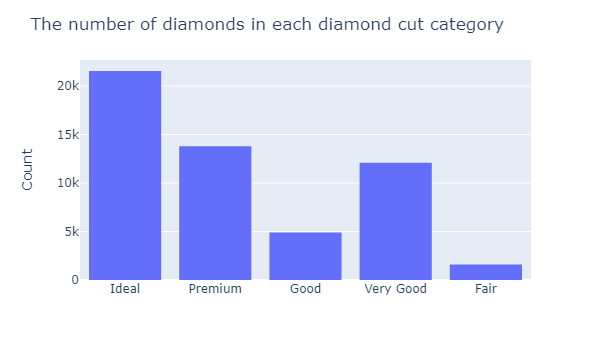

In [90]:
fig.update_layout(
    title="The number of diamonds in each diamond cut category",
    xaxis_title="",
    yaxis_title="Count",
    legend={"title": "Cut"},
)

In [91]:
mean_prices = (
    diamonds.groupby("cut")["price"].mean().reset_index()
)

mean_prices

,cut,price
0,Fair,4358.757764
1,Good,3928.864452
2,Ideal,3457.541970
3,Premium,4584.257704
4,Very Good,3981.759891


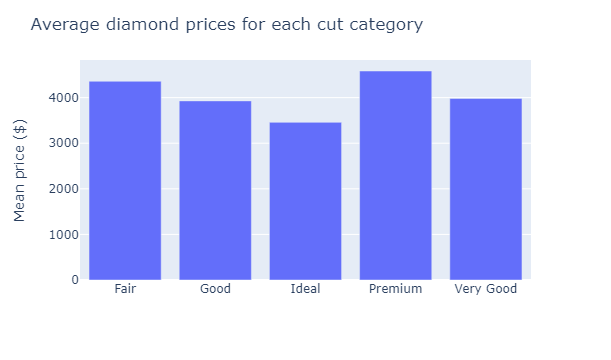

In [92]:
fig = px.bar(mean_prices, x="cut", y="price")

fig.update_layout(
    title="Average diamond prices for each cut category",
    xaxis_title="",
    yaxis_title="Mean price ($)",
)

fig.show()

### Box plots

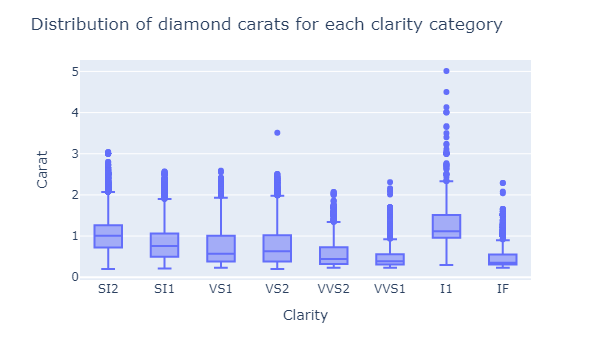

In [93]:
fig = px.box(diamonds, x="clarity", y="carat")

fig.update_layout(
    title="Distribution of diamond carats for each clarity category",
    xaxis_title="Clarity",
    yaxis_title="Carat",
)

fig.show()

## Visualizing relationships between features

teach how to display relationships between two variables

### Scatterplots in Plotly Express

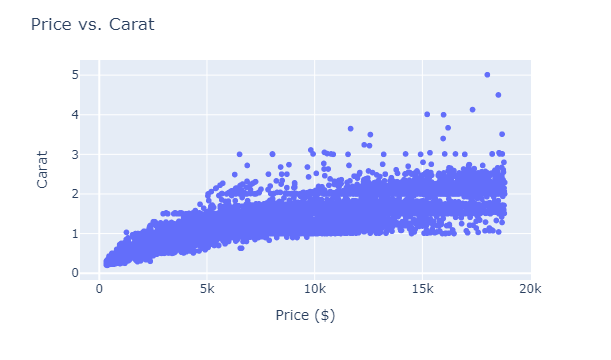

In [94]:
fig = px.scatter(diamonds, x="price", y="carat")

fig.update_layout(
    title="Price vs. Carat",
    xaxis_title="Price ($)",
    yaxis_title="Carat",
)

fig.show()

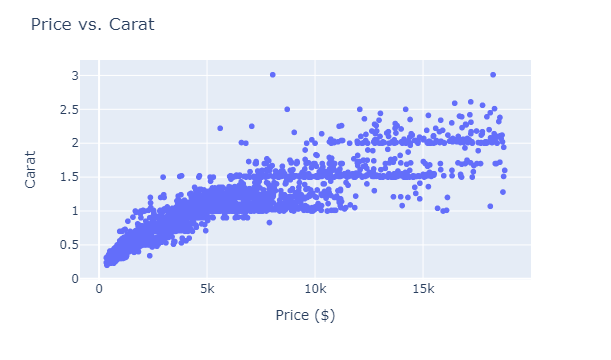

In [95]:
fig = px.scatter(
    diamonds.sample(5000), x="price", y="carat"
)

fig.update_layout(
    title="Price vs. Carat",
    xaxis_title="Price ($)",
    yaxis_title="Carat",
)

fig.show()

### Heatmaps

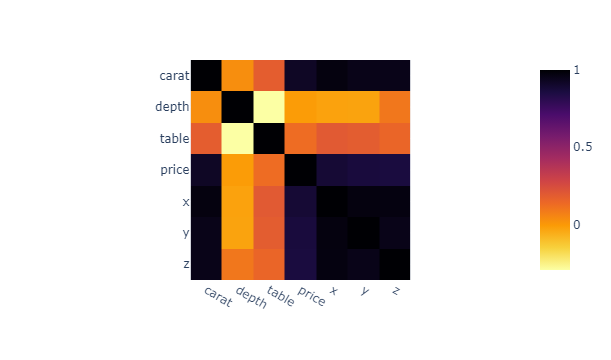

In [96]:
import plotly.express as px

# Create heatmap using Plotly Express
fig = px.imshow(
    diamonds.corr(),
    color_continuous_scale="Inferno_r",
)

# Show plot
fig.show()

## Customizing plots in Plotly Express

teach the various ways the reader can change markers, linestyle, colors and palettes

### Colors

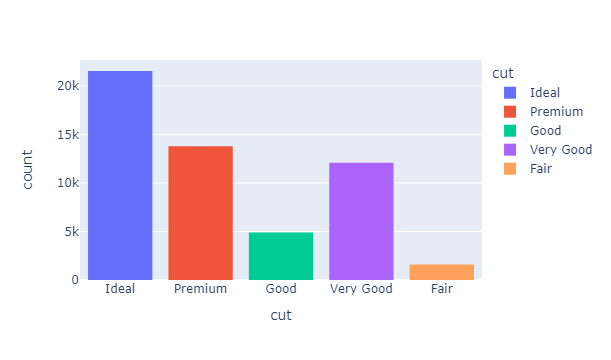

In [97]:
fig = px.histogram(diamonds, x="cut", color="cut")

fig.show()

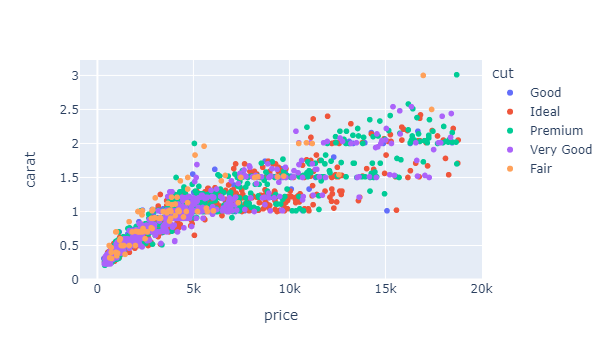

In [98]:
sample = diamonds.sample(3000)

fig = px.scatter(sample, x="price", y="carat", color="cut")

fig.show()

### Markers

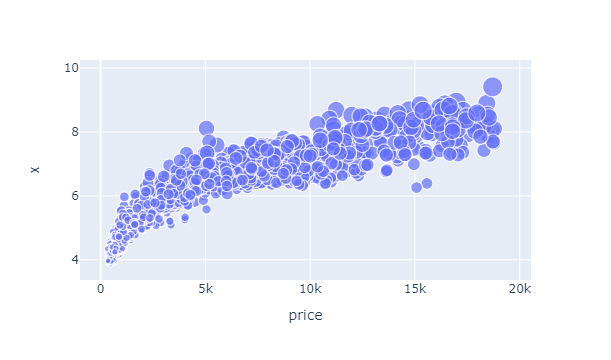

In [99]:
fig = px.scatter(sample, x="price", y="x", size="carat")

fig.show()

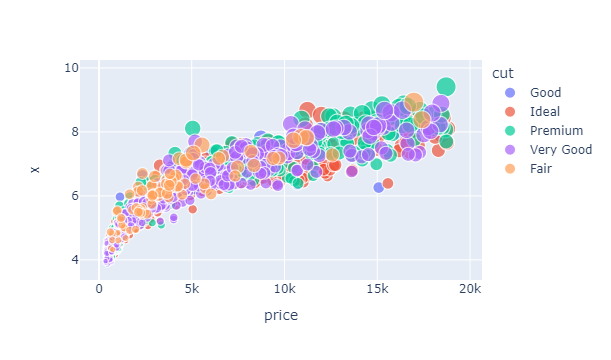

In [100]:
fig = px.scatter(
    sample, x="price", y="x", size="carat", color="cut"
)

fig.show()

## Conclusion